In [2]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt

import torch

GLOB_FOR_FILES = "/media/pawel/DATA/tmp/freddie_mercuries/z*.npy"

In [3]:
z_files = glob(GLOB_FOR_FILES)
z_files

['/media/pawel/DATA/tmp/freddie_mercuries/z_new.npy',
 '/media/pawel/DATA/tmp/freddie_mercuries/z_out.npy',
 '/media/pawel/DATA/tmp/freddie_mercuries/z_pix_and_landmarks.npy',
 '/media/pawel/DATA/tmp/freddie_mercuries/z_smaller_lr.npy']

In [24]:
zs = [np.load(z_file) for z_file in z_files]

In [32]:
reshaped = [z.reshape((-1, 256)) for z in zs[:5]]

In [33]:
reshaped

[array([[ 0.9658097 , -1.8749821 ,  0.11780234, ..., -0.79871196,
         -0.6966442 , -0.22700103],
        [-0.47826147,  0.6773201 , -1.2227517 , ..., -0.35526633,
          0.17727569, -0.5504678 ],
        [-1.081805  , -0.7357168 , -0.17258841, ..., -0.1248986 ,
         -0.9152868 ,  0.3971068 ],
        ...,
        [-0.11342046, -0.6128887 , -1.0734202 , ...,  1.2023113 ,
         -0.34818447, -0.70234525],
        [ 0.09634184,  3.0776086 , -0.12854545, ...,  0.17810135,
         -2.3706193 ,  1.2624787 ],
        [-0.50334144, -0.73262393,  1.3906862 , ..., -1.0099093 ,
          1.4407699 , -0.35747385]], dtype=float32),
 array([[ 8.1543493e-01, -1.7813629e+00,  2.5791533e-03, ...,
         -8.7645715e-01, -6.3553214e-01, -1.1813167e-01],
        [-3.1244469e-01,  1.6924757e-01, -1.2272471e+00, ...,
         -6.3106722e-01, -1.3111310e-01, -2.3757336e-01],
        [-1.4048982e+00, -1.0287524e+00, -3.6859322e-01, ...,
         -2.0451728e-01, -1.1997428e+00,  3.0974334e-01]

In [34]:
for z in zs[5:]:
    reshaped.append(z)
    


In [47]:
# z_out = np.array([[]])
# for z_resh in reshaped:
    
np.save("/media/pawel/DATA/tmp/freddie_mercuries/z_out.npy", np.vstack(reshaped))

In [48]:
np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_out.npy")

array([[ 0.9658097 , -1.8749821 ,  0.11780234, ..., -0.79871196,
        -0.6966442 , -0.22700103],
       [-0.47826147,  0.6773201 , -1.2227517 , ..., -0.35526633,
         0.17727569, -0.5504678 ],
       [-1.081805  , -0.7357168 , -0.17258841, ..., -0.1248986 ,
        -0.9152868 ,  0.3971068 ],
       ...,
       [ 0.862267  ,  0.54237705,  1.9942163 , ...,  1.6787635 ,
         1.7683272 , -0.34850702],
       [-0.32934347,  0.40521893, -0.36238152, ..., -0.05037495,
         0.25287518, -1.4769306 ],
       [-0.20844142, -2.6039546 ,  0.2553219 , ...,  1.3251163 ,
         0.6162576 ,  0.39314923]], dtype=float32)

# Do we have something sensible persisted as z?

In [3]:
from find_z import load_generator, load_landmarks_model
from pathlib import Path
from PIL import Image
LATENT_DIM = 256

def prep_tensor_to_show(tensor):
    return tensor.permute(1, 2, 0).detach().to('cpu').numpy()

def show_tensor_picture(tensor, title=""):
    im_arr = prep_tensor_to_show(tensor)
    plt.title(title)
    plt.axis("off")
    plt.imshow(im_arr)
    

def plot_images(images, labels, nrows, ncols, step=1, title="", figsize=[8, 4]):
    """Plot nrows x ncols images from images and set labels as titles."""
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        idx = i * step
        if images[i].shape[-1] == 1:
            ax.imshow((images[i]).reshape(images[idx].shape[0], images[idx].shape[1]))
        else:
            ax.imshow((images[idx]))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(labels[idx])
    fig.suptitle(title)
    plt.tight_layout()
    # plt.savefig(f"{title}.png")
    plt.show()
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


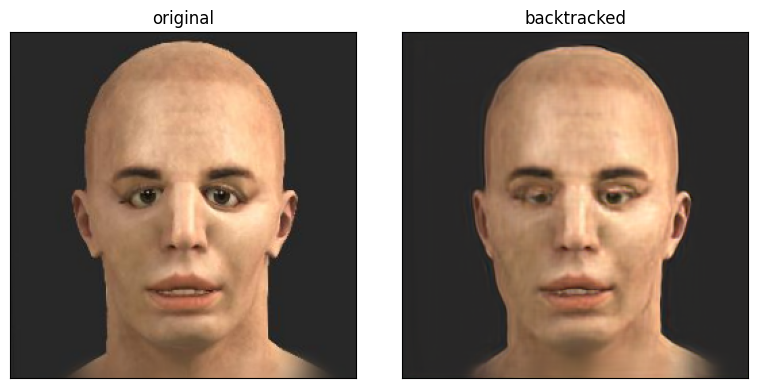

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


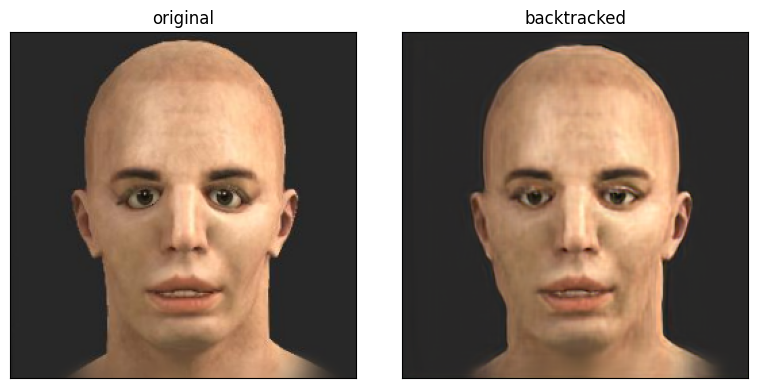

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


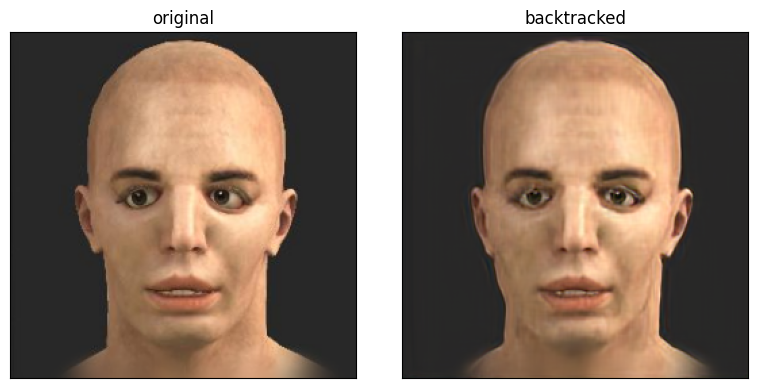

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


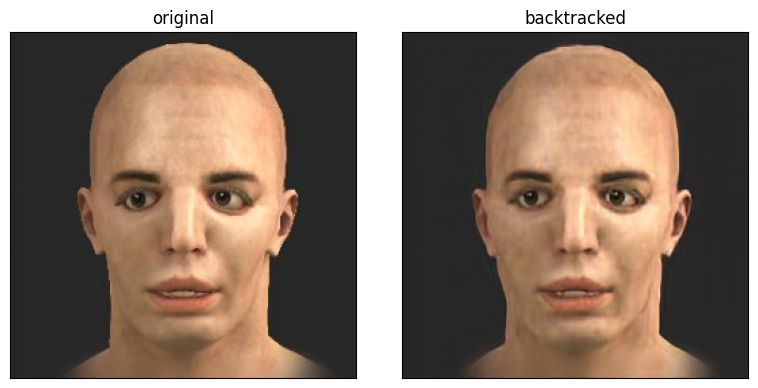

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


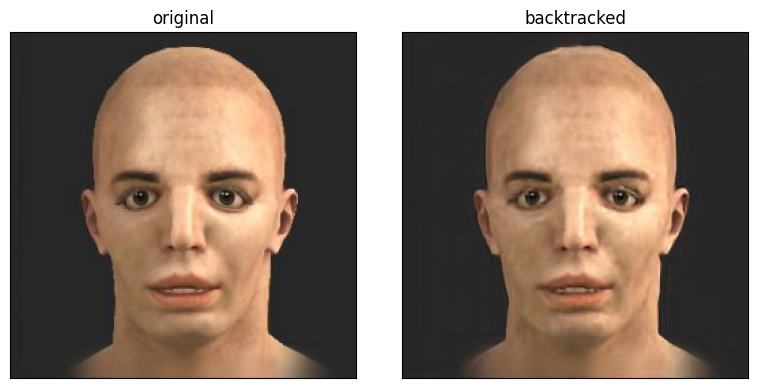

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


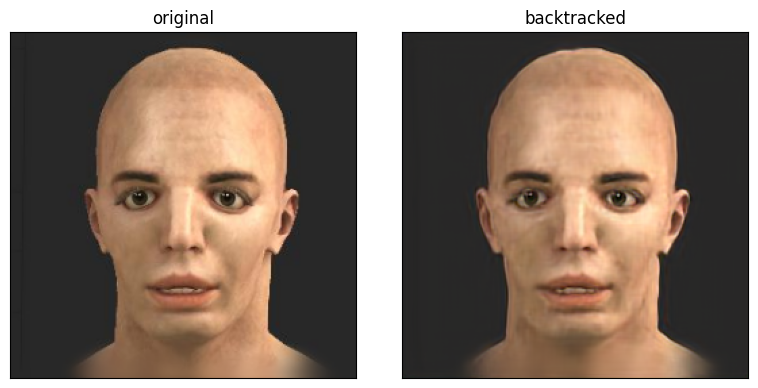

In [7]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:6]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_out.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:6, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


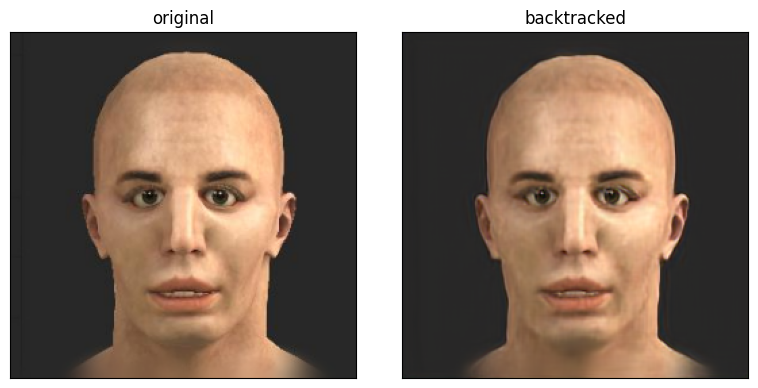

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


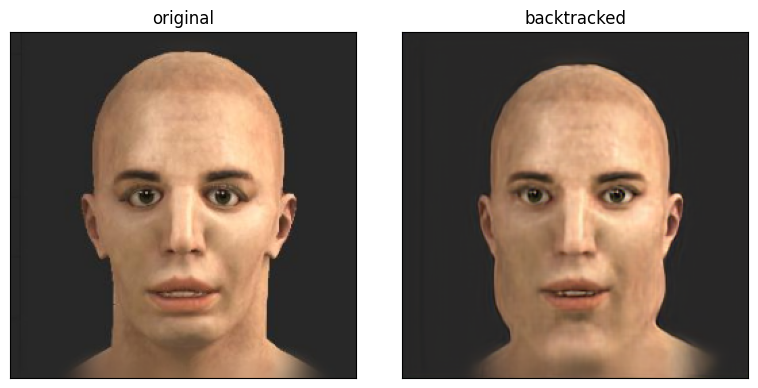

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


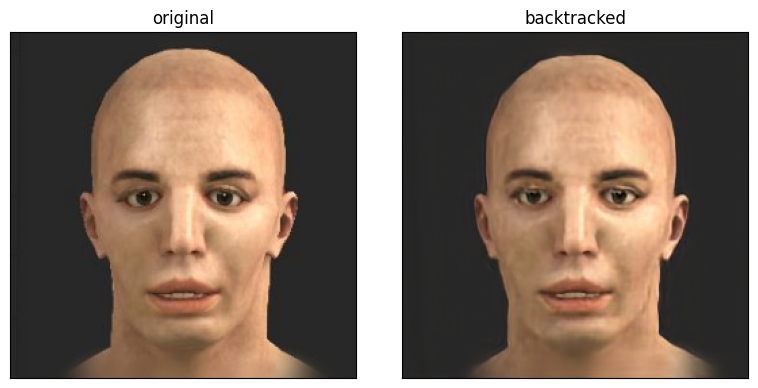

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


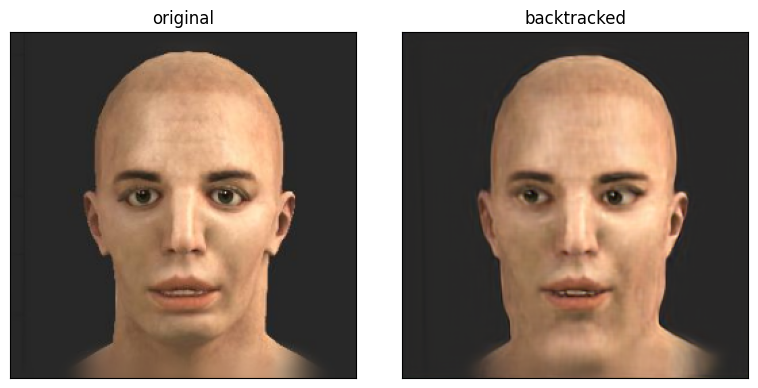

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


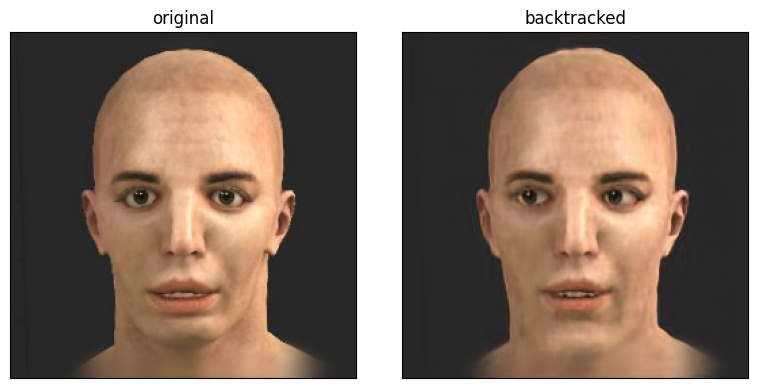

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


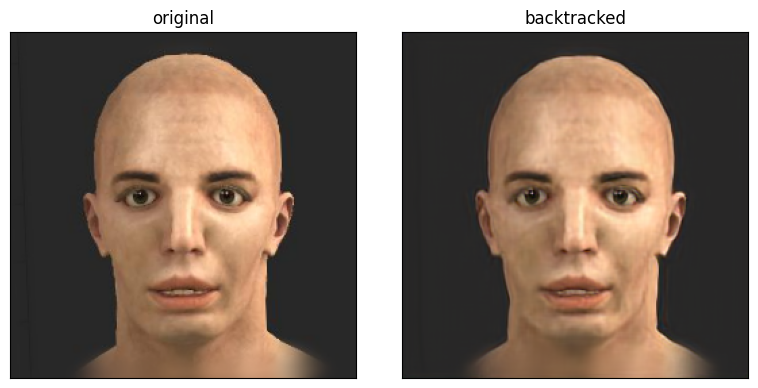

In [6]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[120:126]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_new.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:6, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


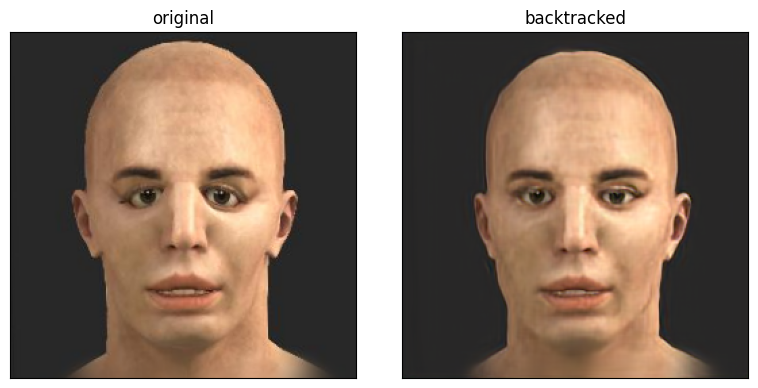

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


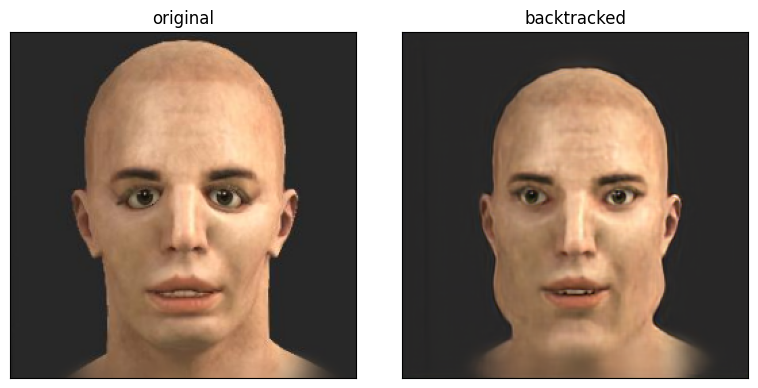

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


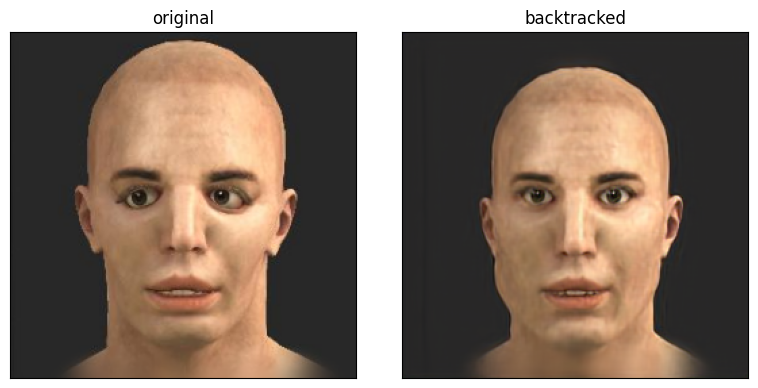

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


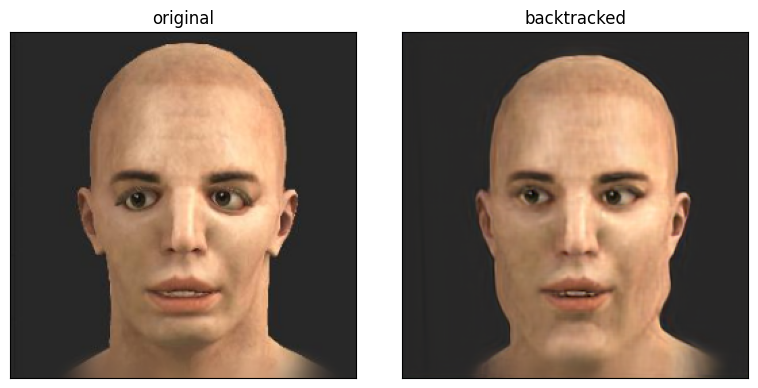

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


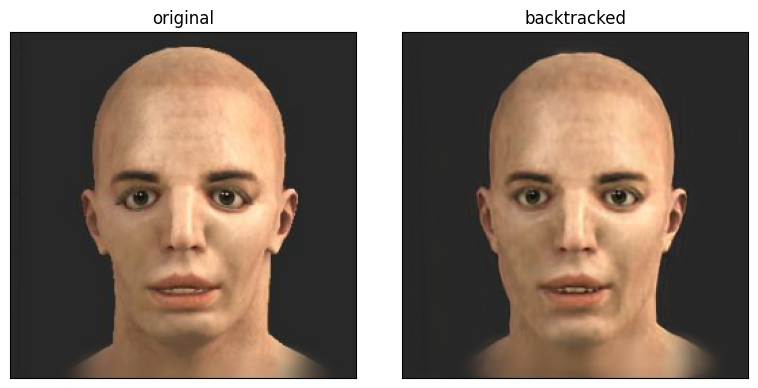

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


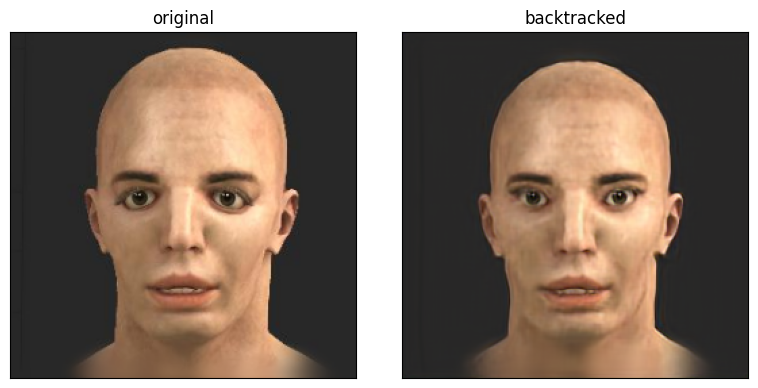

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


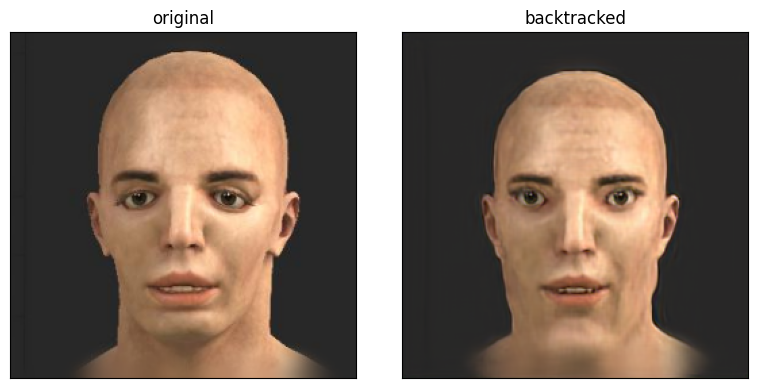

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


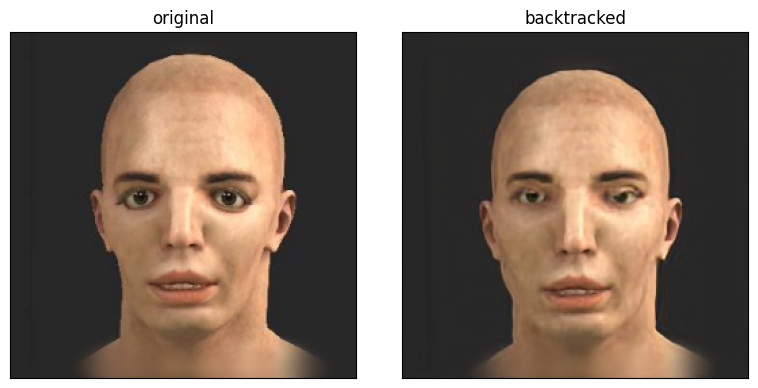

In [5]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:8]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_smaller_lr.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:8, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


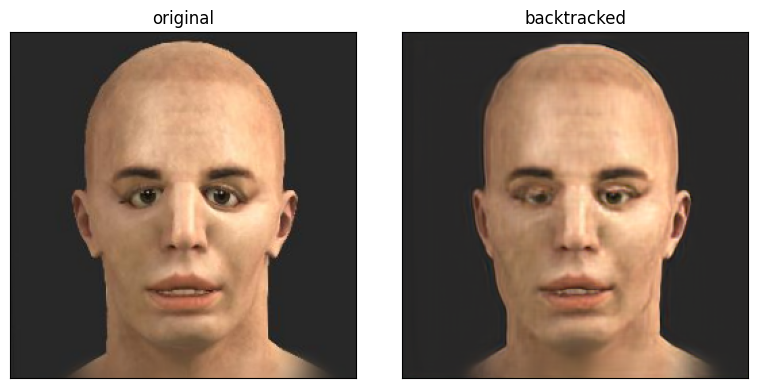

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


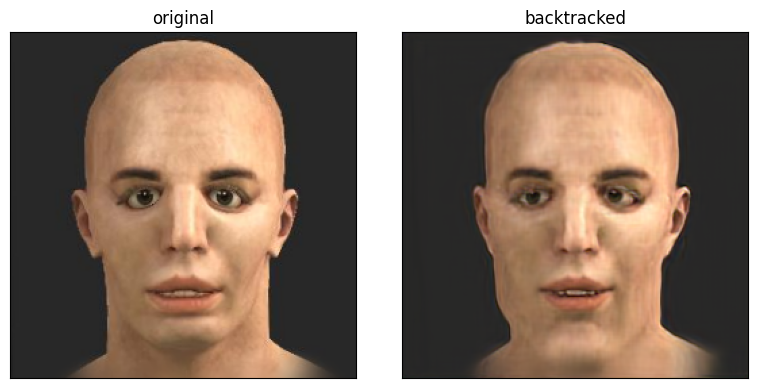

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


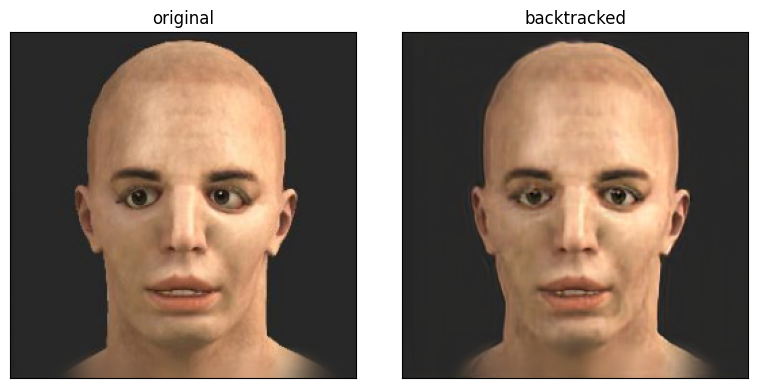

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


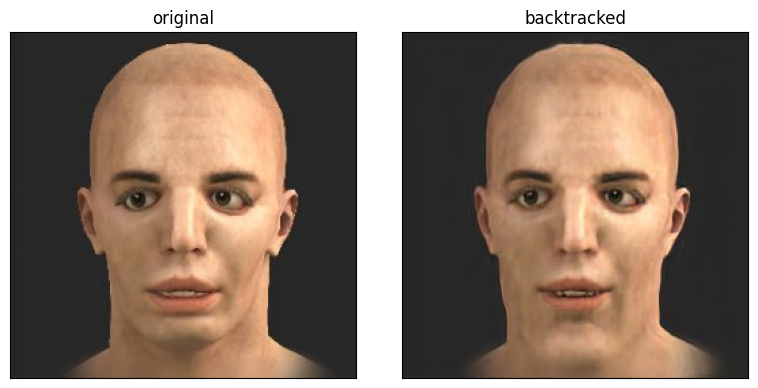

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


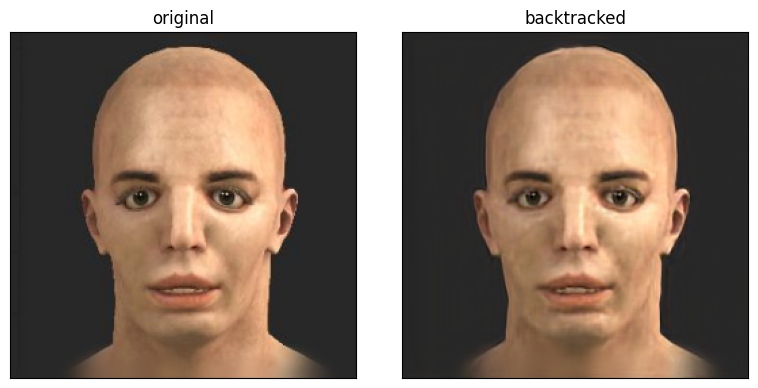

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


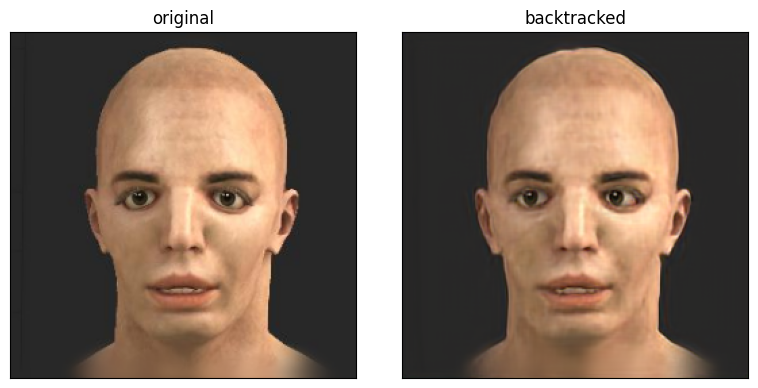

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


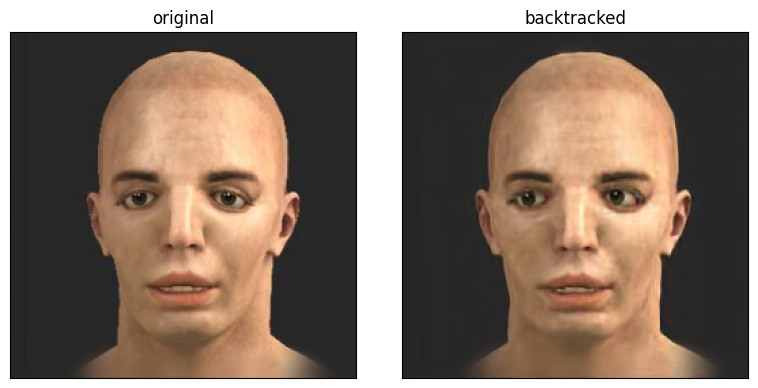

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


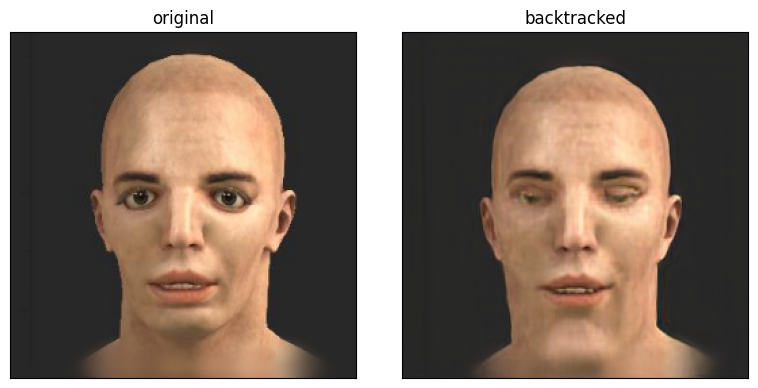

In [4]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:8]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_pix_and_landmarks.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:8, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


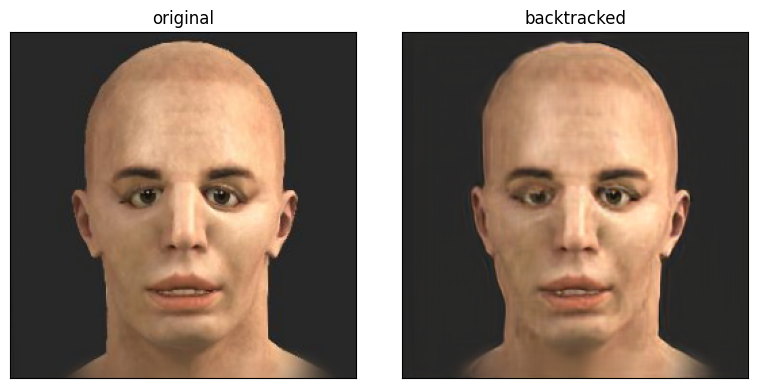

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


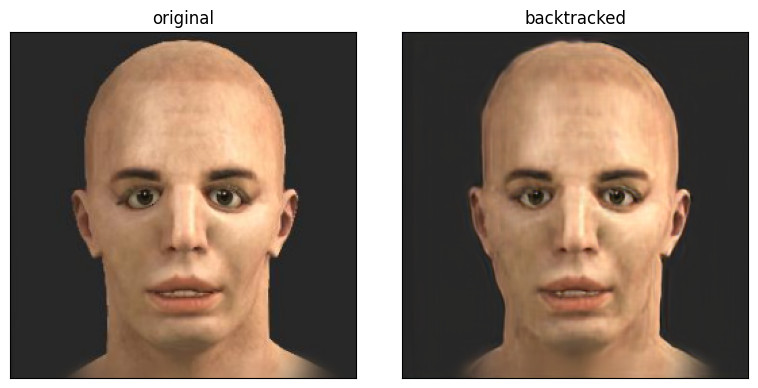

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


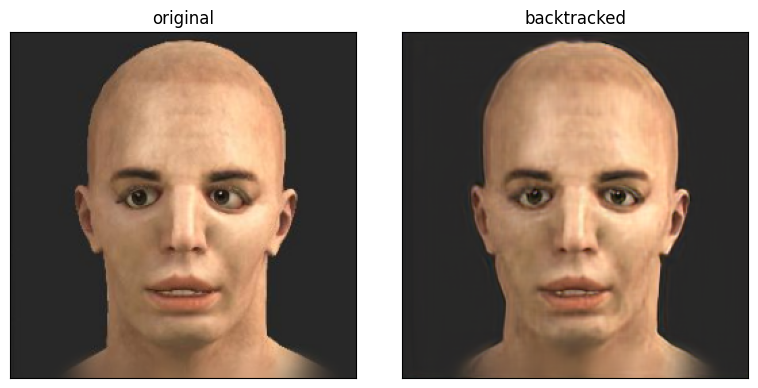

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


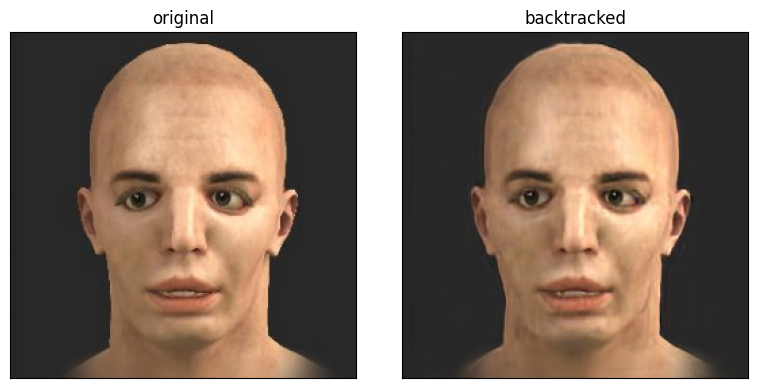

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


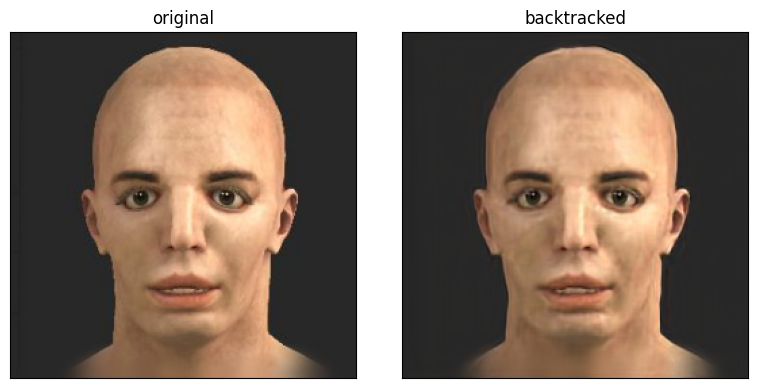

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


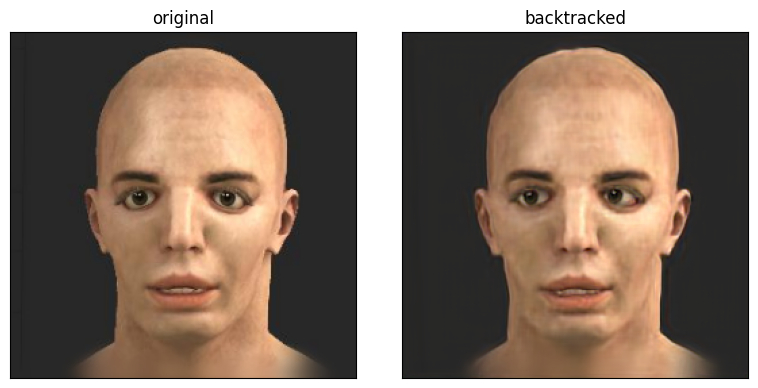

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


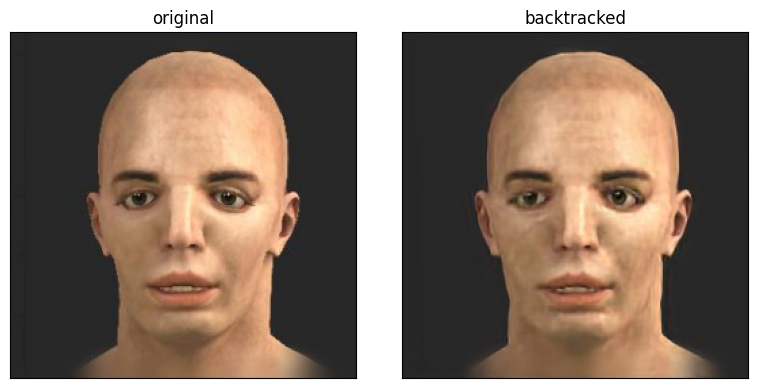

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


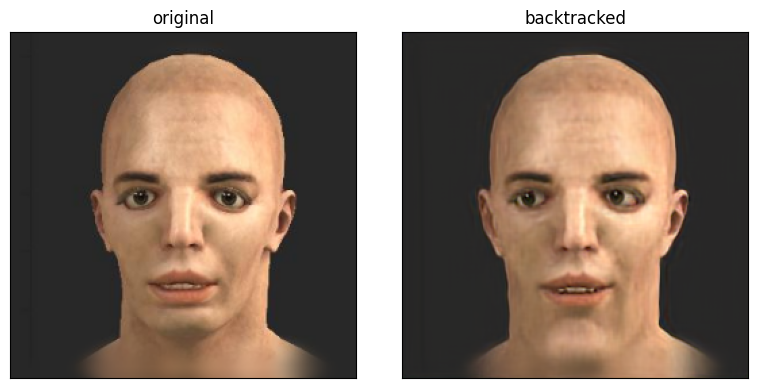

In [5]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:8]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_pix_more_and_landmarks.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:8, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


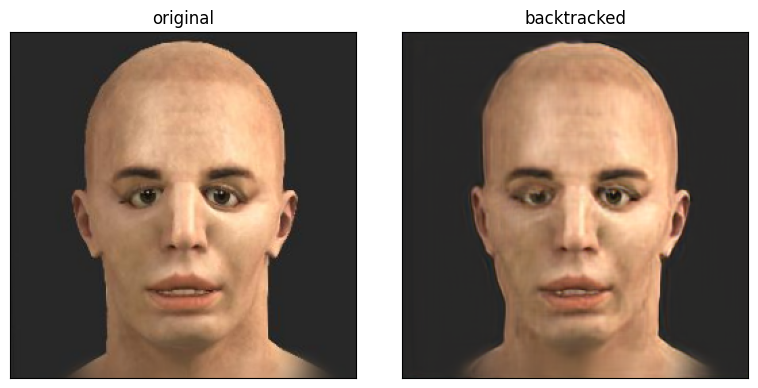

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


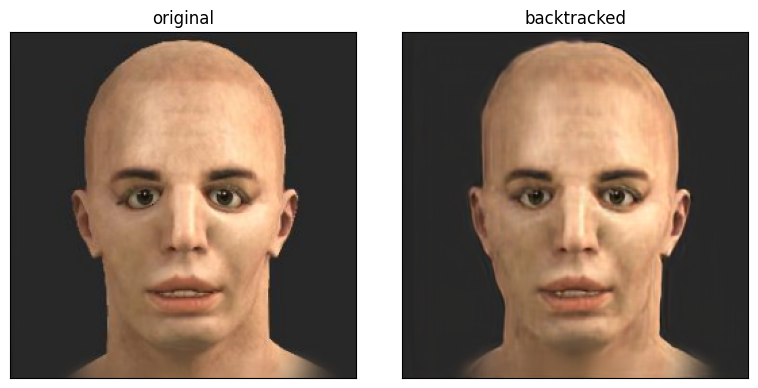

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


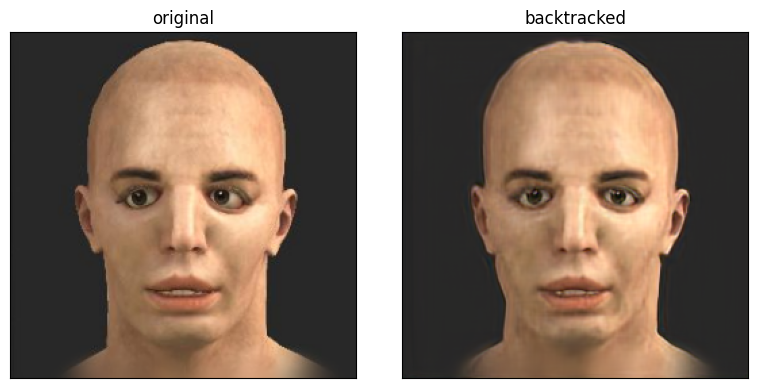

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


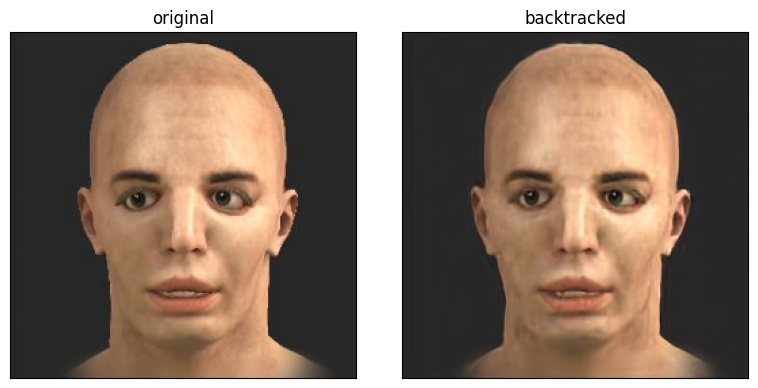

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


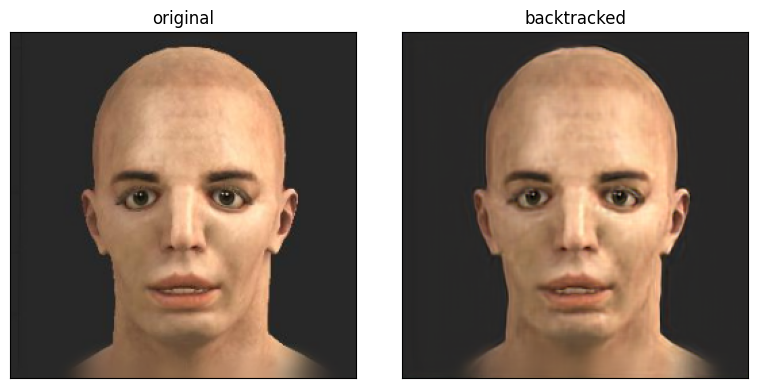

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


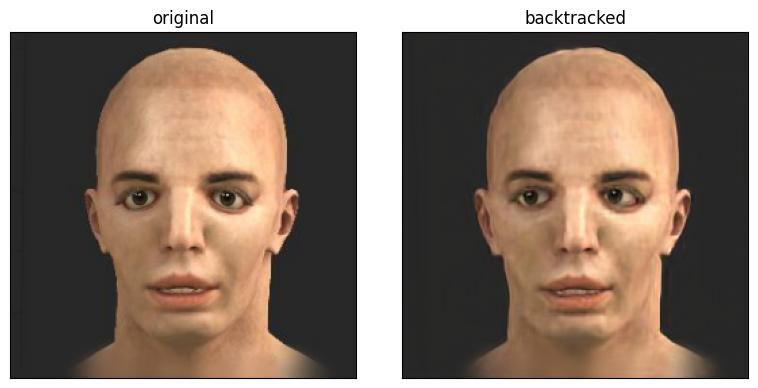

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


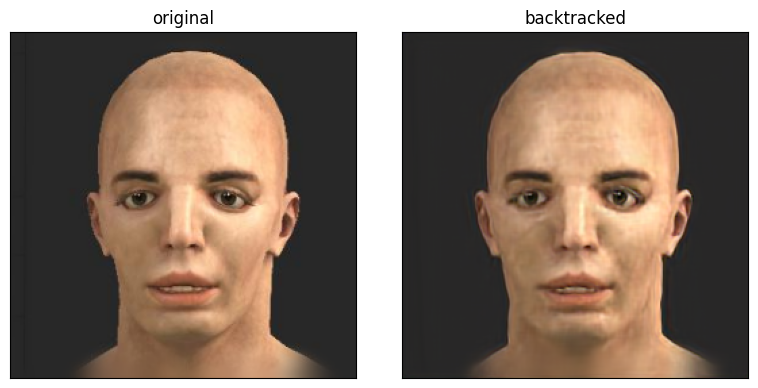

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


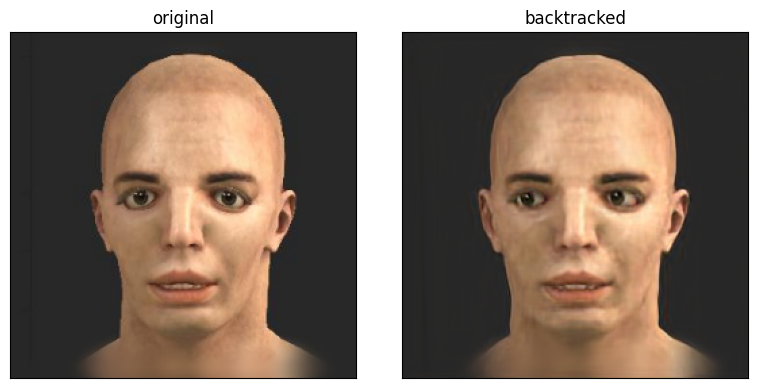

In [4]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:8]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_pix_even_more_and_landmarks.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:8, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


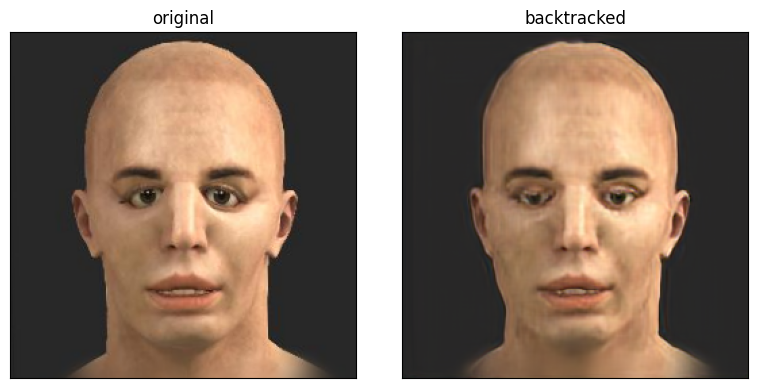

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


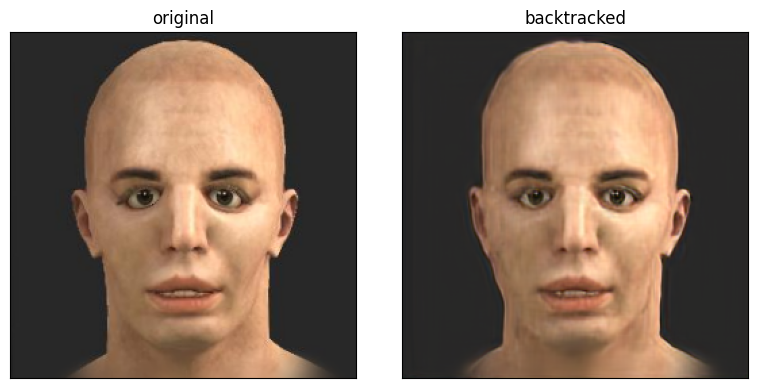

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


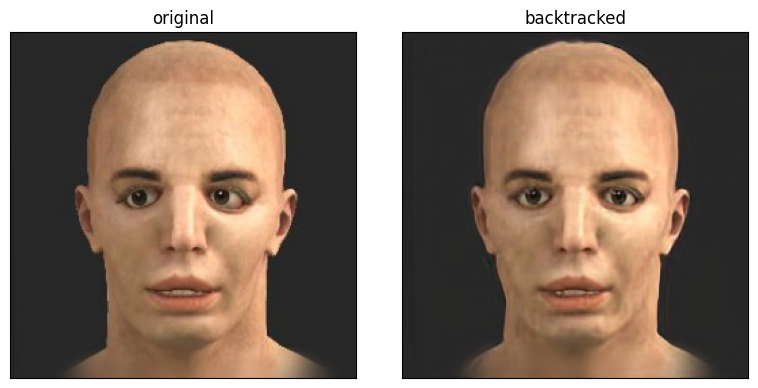

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


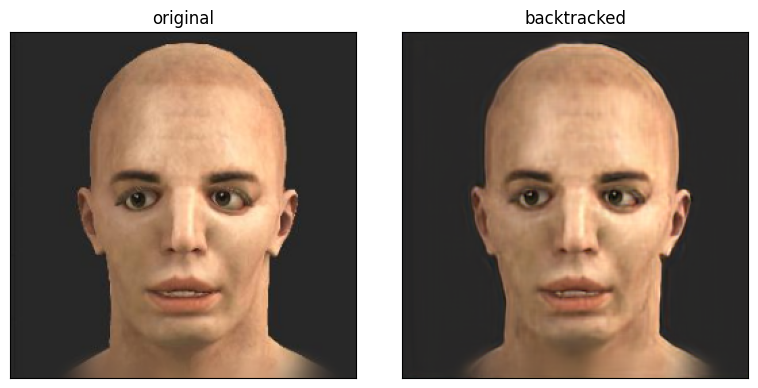

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


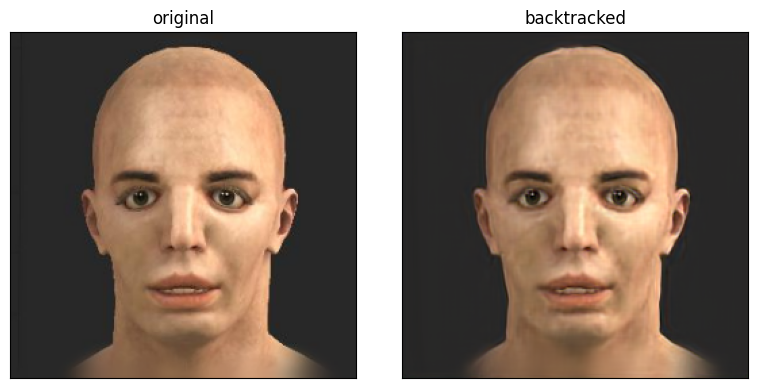

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


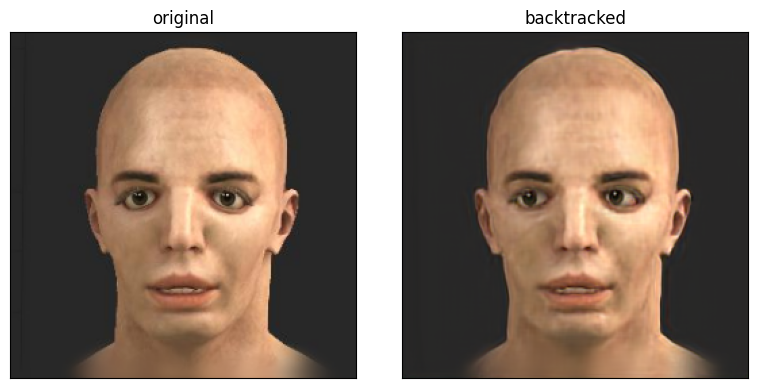

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


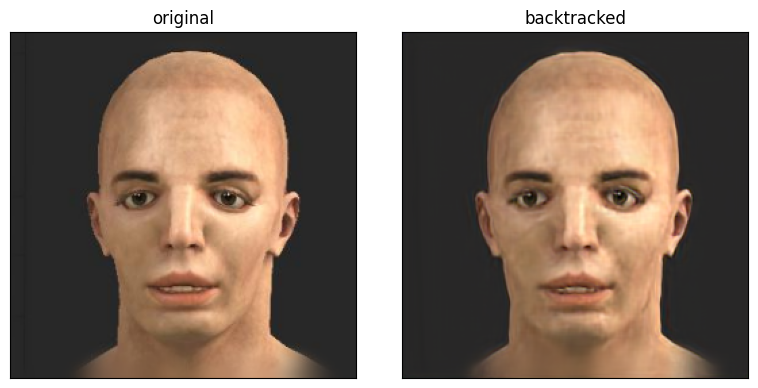

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


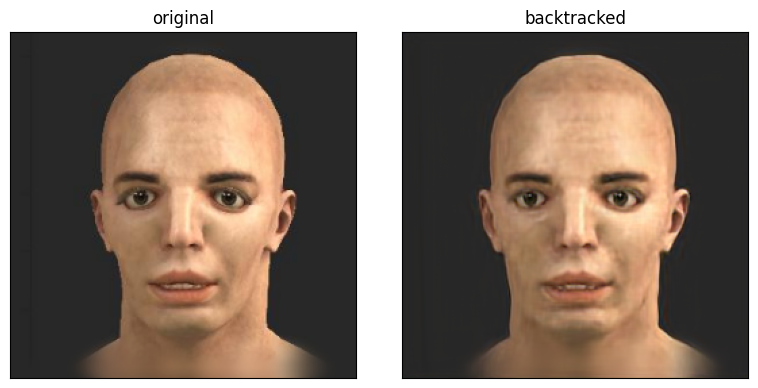

In [8]:
original_images = [np.array(Image.open(Path(p))) for p in sorted(glob("/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned/*"))[:8]]

generator = load_generator()
z = torch.from_numpy(np.load("/media/pawel/DATA/tmp/freddie_mercuries/z_less_iter.npy")).cuda(0)

generated_images = [prep_tensor_to_show(g) for g in generator(z[:8, :])]

for original, generated in zip(original_images, generated_images):
    plot_images([original, generated], ["original", "backtracked"], 1, 2)